In [3]:
# standard libs
import os
import sys
import logging
from functools import partial

# project lib
PROJECT_SRC_PATH = os.path.join(os.path.abspath(''), '..', 'src')
sys.path.append(PROJECT_SRC_PATH)

import utils
import dataset
import visualizations
from prediction_age import AgePredictor
from prediction_type import TypeClassifier
from prediction_floors import FloorsPredictor, FloorsClassifier
from preprocessing import *

# external libs
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

import geopandas as gpd
from shapely import wkt

import shap

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, AdaBoostClassifier
from xgboost import XGBRegressor, XGBClassifier, XGBRFClassifier

/usr/local/Caskroom/miniconda/base/envs/uf-ml/lib/python3.8/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(
pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


In [4]:
pd.set_option("display.max_columns", None)

logging.basicConfig(format='%(asctime)s | %(levelname)s : %(message)s', level=logging.INFO)

In [3]:
%load_ext autoreload
%autoreload 2

## Data

In [21]:
df_bdnb = gpd.read_file('~/Downloads/open_data_millesime_2023-01-a_france_gpkg/gpkg/bdnb.gpkg', rows=100)
df_bdnb

,cle_interop_adr,code_departement_insee,ban_numero,ban_rep,ban_type_voie,ban_nom_voie,ban_libelle_adresse,ban_code_postal,ban_code_commune_insee,ban_libelle_commune,ban_source,ban_nb_bat_grp,ban_nb_bat_grp_hors_dep,geometry
0,0010000A000300101,01,5021,None,champ,maconnais,5021 CHAMP MACONNAIS L'Abergement-Clémenciat,None,01001,L'Abergement-Clémenciat,Arcep,NaN,NaN,POINT (847923.625 6566562.500)
1,001000ZM006100101,01,5305,None,None,l ordre,5305 l ordre L'Abergement-Clémenciat,None,01001,L'Abergement-Clémenciat,Arcep,NaN,NaN,POINT (848870.750 6561932.000)
2,005000AB009200101,01,66,None,impasse,de la barriere,66 Impasse de la Barriere Ambérieux-en-Dombes,None,01005,Ambérieux-en-Dombes,Arcep,NaN,NaN,POINT (847266.875 6546130.000)
3,005000AB011300103,01,5308,None,None,le bourg,5308 le bourg Ambérieux-en-Dombes,None,01005,Ambérieux-en-Dombes,Arcep,NaN,NaN,POINT (847454.375 6546116.500)
4,005000AB014100101,01,74,None,impasse,de la barriere,74 Impasse de la Barriere Ambérieux-en-Dombes,None,01005,Ambérieux-en-Dombes,Arcep,NaN,NaN,POINT (847267.500 6546141.000)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,01001_0095_00697,01,697,None,route,du chateau,697 Route du Château 01400 L'Abergement-Clémen...,01400,01001,L'Abergement-Clémenciat,BAN,1.0,1.0,POINT (848108.023 6563959.461)
96,01001_0100_00008,01,8,None,impasse,des chenes,8 Impasse des Chênes 01400 L'Abergement-Clémen...,01400,01001,L'Abergement-Clémenciat,BAN,1.0,1.0,POINT (848316.001 6562896.227)
97,01001_0100_00035,01,35,None,impasse,des chenes,35 Impasse des Chênes 01400 L'Abergement-Cléme...,01400,01001,L'Abergement-Clémenciat,BAN,1.0,1.0,POINT (848313.322 6562930.153)
98,01001_0100_00036,01,36,None,impasse,des chenes,36 Impasse des Chênes 01400 L'Abergement-Cléme...,01400,01001,L'Abergement-Clémenciat,BAN,1.0,1.0,POINT (848343.504 6562917.669)


In [5]:
df_fr = pd.read_pickle('../../building-stock/data/BDNB-EUBUCCO-dep-58.pkl')

In [13]:
XGBOOST_PARAMS = {'tree_method': 'hist'}
HYPERPARAMETERS = {
    'max_depth': 10,
    'learning_rate': 0.05,
    'n_estimators': 400,
    'colsample_bytree': 0.5,
    'subsample': 0.7,
}

## Preprocessing

In [15]:
df_fr.sort_values('EUBUCCO_id').head(1000).set_geometry('geometry_BC').explore()


In [41]:
df_fr['type_str_ffo'].value_counts()

Masonry          174731
Concrete           8355
Unknown_Other      7159
Wood                359
Name: type_str_ffo, dtype: int64

## Experiments

### Classification approach

In [7]:
# multiple buildings having identical id_source / BATIMENT id (maybe not so important because essentially all of them have a consistent construction type)
# df_fr[df_fr['id'] == 'v0.1-FRA.7.2.6.3_1-29973']
df_fr.groupby('id')['type_str_ffo'].nunique().value_counts()

1    24849
2        6
Name: type_str_ffo, dtype: int64

In [8]:
df_fr_pp = df_fr[df_fr['type_str_ffo'] != 'Unknown_Other']

2024-02-23 15:29:23,703 | INFO : Dataset length original: 22011

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
2024-02-23 15:29:23,743 | INFO : Dataset length after dropping NaNs: 22011

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
2024-02-23 15:29:23,795 | INFO : Dataset length after dropping duplicates: 22011
2024-02-23 15:29:23,803 | INFO : Dataset allocated memory: 30 MB
2024-02-23 15:29:23,837 | INFO : No abort signal received. Continuing... To abort please create /Users/fnachtigall/workspace/ufo-prediction/metadata/local-d0da5ed1.abort.
2024-02-23 15:29:23,838 | INFO : Training dataset length: 17608
2024-02-23 15:29:23,839 | INFO : Test dataset length: 4403
2024-02

Classification report:
               precision    recall  f1-score  support
Masonry        0.954906  0.989712  0.971998     3402
Concrete       0.900000  0.709360  0.793388      406
Wood           0.647059  0.200000  0.305556       55
accuracy       0.949003  0.949003  0.949003        0
macro avg      0.833988  0.633024  0.690314     3863
weighted avg   0.944753  0.949003  0.943737     3863
Cohen’s kappa: 0.7279
Matthews correlation coefficient (MCC): 0.7386


FixedFormatter should only be used together with FixedLocator


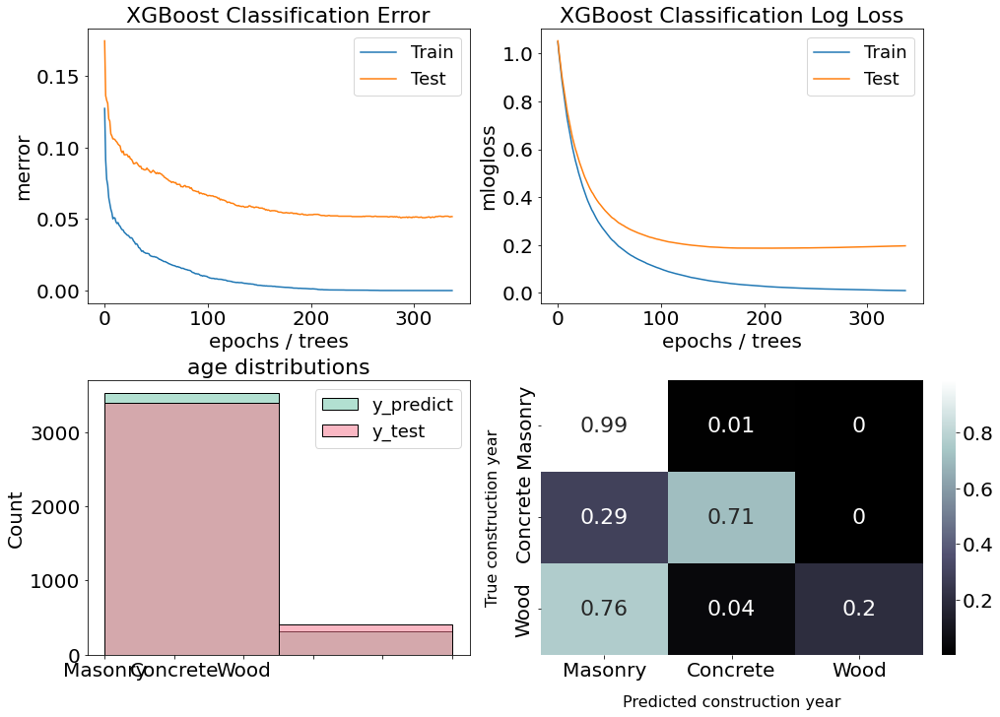

In [17]:
classifier = TypeClassifier(
    model=XGBClassifier(**XGBOOST_PARAMS),
    df=df_fr_pp,
    labels=['Masonry', 'Concrete', 'Wood'],
    test_training_split=split_80_20,
    # preprocessing_stages=[remove_buildings_pre_1900],
    # preprocessing_stages=[remove_buildings_pre_1900, partial(filter_features, selection=dataset.STREET_FEATURES + dataset.BUILDING_FEATURES)],
    preprocessing_stages=[remove_buildings_pre_1900, partial(use_other_attributes_as_features, target=dataset.TYPE_ATTRIBUTE)],
    mitigate_class_imbalance=True,
    hyperparameters=HYPERPARAMETERS,
)
classifier.evaluate()

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


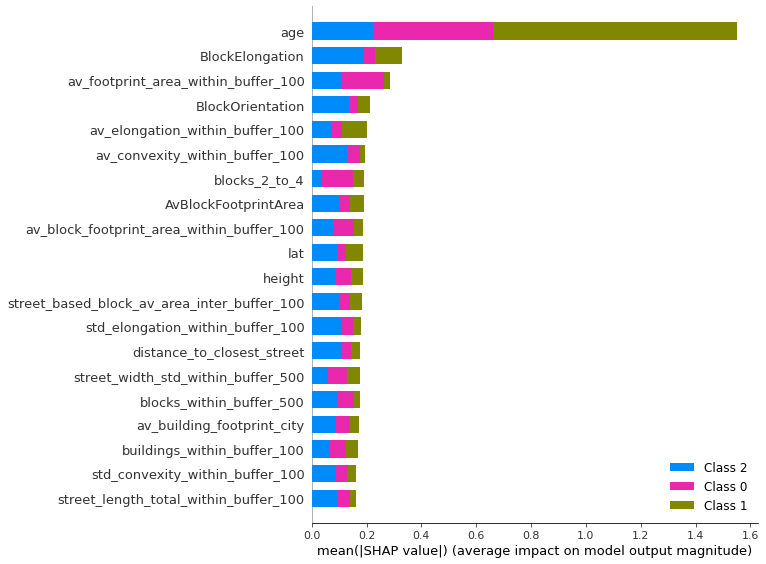

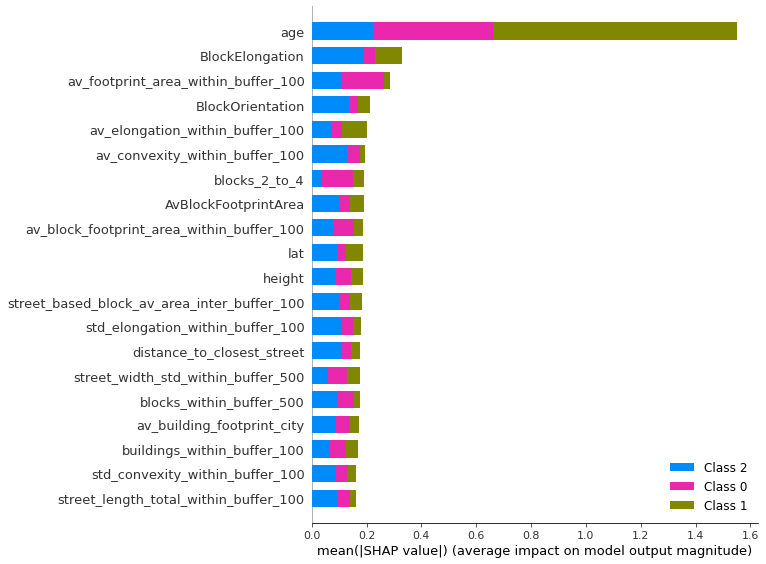

In [18]:
classifier.SHAP_analysis()

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


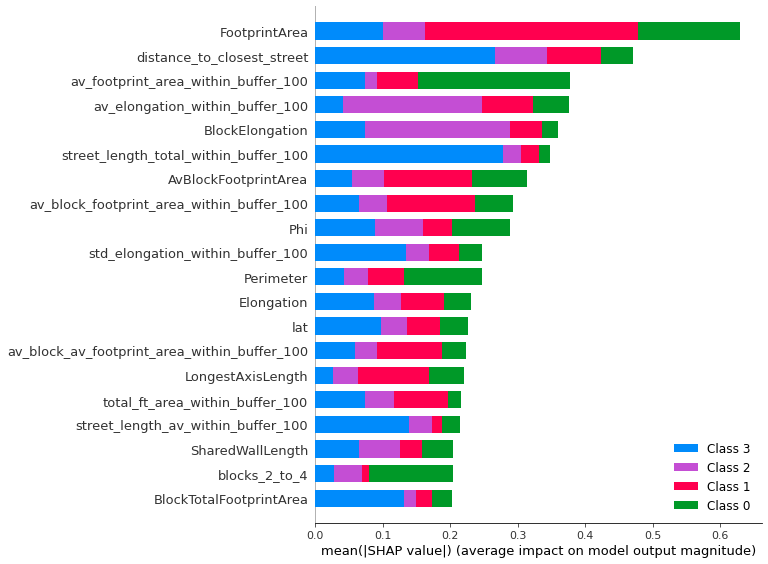

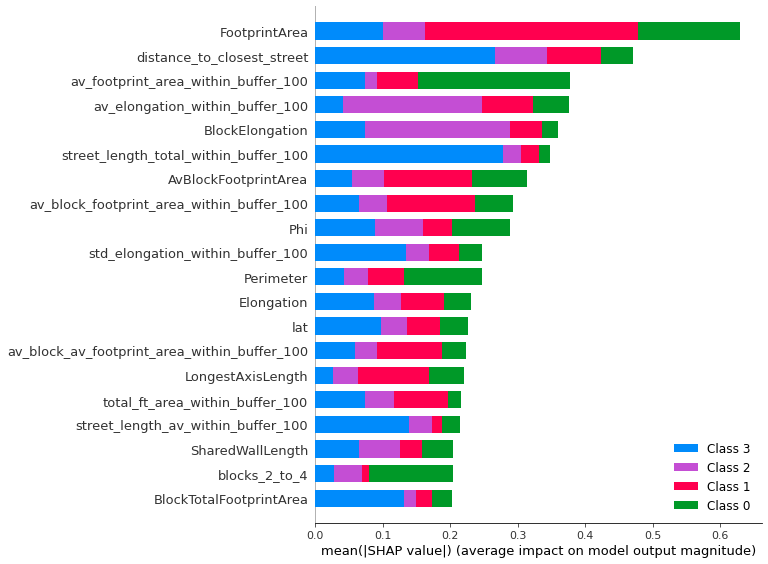

In [6]:
classifier.SHAP_analysis()